In [967]:
from pathlib import Path
import zipfile
import pandas as pd
import seaborn as sns
import plotly_express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import math
import matplotlib.pyplot as plt
import scipy
import datetime
from IPython.display import display, HTML
from itertools import chain,cycle
import plotly.io as pio

pd.options.display.float_format = "{:.2f}".format

https://www.kaggle.com/datasets/jeannicolasduval/world-athletics-all-time-rankings

# EDA

## Get dfs from zip file

In [968]:
with zipfile.ZipFile('world-athletics_all-time-top-lists.zip', 'r') as z:
    file_list = z.namelist()
    for data_file_name in file_list:            
        with z.open(data_file_name) as f:
            if data_file_name.endswith('.csv'):                
                df = pd.read_csv(f)

In [969]:
df.head()

,all_time_rank,results_score,event,category,event_rank,mark,competitor,nat,date_of_birth,pos,...,venue,age,wind,mark_details,year_of_birth,event_name,event_type,environment,age_category,gender
0,1.00,1382.00,Women's Discus Throw,Outdoor Senior - Women,1,76.8,Gabriele REINSCH,GDR,1963-09-23,1.0,...,Neubrandenburg (GDR),24.80,NaN,NaN,1963.00,discus-throw,throws,outdoor,senior,women
1,2.00,1372.00,Women's Shot Put,Outdoor Senior - Women,1,22.63,Natalya LISOVSKAYA,URS,1962-07-16,1.0,...,Moskva (URS),24.90,NaN,NaN,1962.00,shot-put,throws,outdoor,senior,women
2,3.00,1371.00,Women's Shot Put,Outdoor Senior - Women,2,22.6,Natalya LISOVSKAYA,URS,1962-07-16,NaN,...,Moskva (URS),24.90,NaN,NaN,1962.00,shot-put,throws,outdoor,senior,women
3,4.00,1367.00,Women's Shot Put,Outdoor Senior - Women,3,22.55,Natalya LISOVSKAYA,URS,1962-07-16,1.0,...,Tallinn (EST),26.00,NaN,NaN,1962.00,shot-put,throws,outdoor,senior,women
4,5.00,1366.00,Women's Shot Put,Outdoor Senior - Women,4,22.53,Natalya LISOVSKAYA,URS,1962-07-16,1.0,...,Kiev (URS),26.10,NaN,NaN,1962.00,shot-put,throws,outdoor,senior,women


## First look

In [970]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 488643 entries, 0 to 488642
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   all_time_rank  365871 non-null  float64
 1   results_score  484734 non-null  float64
 2   event          488643 non-null  object 
 3   category       488643 non-null  object 
 4   event_rank     488643 non-null  int64  
 5   mark           488643 non-null  object 
 6   competitor     488643 non-null  object 
 7   nat            488643 non-null  object 
 8   date_of_birth  477276 non-null  object 
 9   pos            485407 non-null  object 
 10  date           488643 non-null  object 
 11  venue          488643 non-null  object 
 12  age            477276 non-null  float64
 13  wind           81399 non-null   float64
 14  mark_details   11241 non-null   object 
 15  year_of_birth  480450 non-null  float64
 16  event_name     488643 non-null  object 
 17  event_type     488643 non-nul

In [971]:
df.describe()

,all_time_rank,results_score,event_rank,age,wind,year_of_birth
count,365871.00,484734.00,488643.00,477276.00,81399.00,480450.00
mean,180711.48,1148.01,3305.32,25.37,0.48,1981.59
std,104908.95,47.78,2750.60,4.36,0.91,12.86
min,1.00,671.00,1.00,-13.50,-5.70,1913.00
25%,88390.00,1130.00,858.50,22.30,0.00,1973.00
50%,179618.00,1152.00,2614.00,25.10,0.50,1983.00
75%,268322.00,1176.00,5404.00,28.20,1.20,1992.00
max,360700.00,1382.00,9997.00,65.10,2.00,2008.00


In [972]:
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data = missing_data[missing_data['Total'] != 0]
missing_data.head(20)

,Total,Percent
mark_details,477402,0.98
wind,407244,0.83
all_time_rank,122772,0.25
age,11367,0.02
date_of_birth,11367,0.02
year_of_birth,8193,0.02
results_score,3909,0.01
pos,3236,0.01


In [973]:
df = df.drop(columns=['mark_details', 'wind'])

## Type convert

In [974]:
date_columns = ['date_of_birth', 'date']
for column in date_columns:
    df[column] = pd.to_datetime(df[column])

In [975]:
def time_to_seconds(mark: str) -> float:
    if ':' not in mark:        
        return round(float(mark), 2)
    components = mark.split(':')
    if len(components) == 2:
        minutes, seconds = mark.split(':')
        return round(int(minutes) * 60 + float(seconds), 2)
    else:
        hours, minutes, seconds = mark.split(':')
    return round(int(hours) * 3600 + int(minutes) * 60 + float(seconds), 2)

df['mark'] = df['mark'].apply(time_to_seconds)

## Make features

In [976]:
df['season'] = df['date'].dt.year

In [977]:
df.head()

,all_time_rank,results_score,event,category,event_rank,mark,competitor,nat,date_of_birth,pos,date,venue,age,year_of_birth,event_name,event_type,environment,age_category,gender,season
0,1.00,1382.00,Women's Discus Throw,Outdoor Senior - Women,1,76.80,Gabriele REINSCH,GDR,1963-09-23,1.0,1988-07-09,Neubrandenburg (GDR),24.80,1963.00,discus-throw,throws,outdoor,senior,women,1988
1,2.00,1372.00,Women's Shot Put,Outdoor Senior - Women,1,22.63,Natalya LISOVSKAYA,URS,1962-07-16,1.0,1987-06-07,Moskva (URS),24.90,1962.00,shot-put,throws,outdoor,senior,women,1987
2,3.00,1371.00,Women's Shot Put,Outdoor Senior - Women,2,22.60,Natalya LISOVSKAYA,URS,1962-07-16,NaN,1987-06-07,Moskva (URS),24.90,1962.00,shot-put,throws,outdoor,senior,women,1987
3,4.00,1367.00,Women's Shot Put,Outdoor Senior - Women,3,22.55,Natalya LISOVSKAYA,URS,1962-07-16,1.0,1988-07-05,Tallinn (EST),26.00,1962.00,shot-put,throws,outdoor,senior,women,1988
4,5.00,1366.00,Women's Shot Put,Outdoor Senior - Women,4,22.53,Natalya LISOVSKAYA,URS,1962-07-16,1.0,1988-08-14,Kiev (URS),26.10,1962.00,shot-put,throws,outdoor,senior,women,1988


In [978]:
def make_era(date):
    if date < pd.Timestamp('1989-01-01'):
        return '1_pre off-competition testing'
    elif date < pd.Timestamp('2000-01-01'):
        return '2_pre WADA'
    elif date < pd.Timestamp('2005-01-01'):
        return '3_pre standarts'
    elif date < pd.Timestamp('2009-01-01'):
        return '4_pre biopassport'
    else:
        return '5_modern'
    
df['era'] = df['date'].apply(make_era)

In [979]:
def remove_double_name(name):
    if '-' in name.split()[-1]:
        return ' '.join(name.split()[:-1]+name.split()[-1].split('-')[:1])
    else:
        return name

df['name'] = df['competitor'].apply(remove_double_name)

In [980]:
df['season_rank'] = df.groupby(['season', 'event_name', 'gender'])['mark'].rank(method='min', ascending=True)
df['season_rank'] = df['season_rank'].astype('int')

In [981]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 488643 entries, 0 to 488642
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   all_time_rank  365871 non-null  float64       
 1   results_score  484734 non-null  float64       
 2   event          488643 non-null  object        
 3   category       488643 non-null  object        
 4   event_rank     488643 non-null  int64         
 5   mark           488643 non-null  float64       
 6   competitor     488643 non-null  object        
 7   nat            488643 non-null  object        
 8   date_of_birth  477276 non-null  datetime64[ns]
 9   pos            485407 non-null  object        
 10  date           488643 non-null  datetime64[ns]
 11  venue          488643 non-null  object        
 12  age            477276 non-null  float64       
 13  year_of_birth  480450 non-null  float64       
 14  event_name     488643 non-null  object        
 15  

## Data selection

**Not enough data before 1975**

In [982]:
df = df[(df['season'] > 1975)]

**Only senior**

In [983]:
df = df[(df['age_category'] == 'senior') & (df['age'] > 10)]  

**Delete unpopular events**

In [984]:
events_count = df['event_name'].value_counts()
popular_events = events_count[events_count >= 1200].index.tolist()  

In [985]:
df = df[df['event_name'].isin(popular_events)]

## Feature analysis

In [986]:
px.histogram(data_frame=df, x='season', title='Results by season')

**2020 removed due to COVID-19**

In [987]:
px.histogram(data_frame=df, x='age', range_x=[10, 45], title='Age distribution')

In [988]:
environment = df['environment'].value_counts().reset_index()
fig = px.pie(environment, values='count', names='environment')
fig.show()

In [989]:
types = df['event_type'].value_counts().reset_index()
fig = px.pie(types, values='count', names='event_type')
fig.show()

In [990]:
genders = df['gender'].value_counts().reset_index()
fig = px.pie(genders, values='count', names='gender')
fig.show()

## Service functions

In [991]:
def seconds_to_time(seconds: float) -> str:
    minutes = int(seconds // 60)
    seconds = round(seconds % 60, 2)
    return f'{minutes}:{seconds}'

In [1011]:
def convert_to_minutes(row):
    events_to_convert = ['10000-metres', '5000-metres', '3000-metres-steeplechase', '1500-metres', '800-metres', 'marathon']
    if row['event_name'] in events_to_convert:        
        if row['mark'] < 3600:
            minutes, seconds = divmod(row['mark'], 60)
            return f'{int(minutes):02}:{round(seconds, 2):05.2f}'        
        else:
            hours, remainder = divmod(row['mark'], 3600)
            minutes, seconds = divmod(remainder, 60)
            return f'{int(hours)}:{int(minutes):02}:{round(seconds, 2):05.2f}'
    else:
        return row['mark']

In [992]:
def find_athlete(name: str, event_name: str, environment: str = 'outdoor') -> pd.DataFrame:
    return df[(df['name'] == name)&(df['event_name'] == event_name)&(df['environment'] == environment)]

In [993]:
def athletes_with_starts(gender: str,                                                   
                         event: str, 
                         nstarts: int = 20,
                         environment: str = 'outdoor',
                         type_of_filter: str = 'event_name',
                         df: pd.DataFrame = df) -> pd.DataFrame:
    
    if type_of_filter not in ['event_name', 'event_type']:
        raise ValueError('Wrong filter')        
    if event not in df[type_of_filter].unique():
        raise ValueError('Worng event name or type!')        
    if  gender not in df['gender'].unique():
        raise ValueError('Check gender')        
    if environment not in df['environment'].unique():
        raise ValueError('Wrong enviroment')     
    
    result_df = df[
    (df['environment'] == environment)&
    (df['gender'] == gender)&
    (df[type_of_filter] == event)
    ].copy()
 
    names = result_df['name'].value_counts()
    athletes = names[names >= nstarts].index.tolist()    
    result_df = result_df[result_df['name'].isin(athletes)]    
    return result_df

In [994]:
def best_athlete_results(dataframe: pd.DataFrame, 
                         result_type: str = 'results_score',
                         group_by: str = 'name',
                         nbests: int = 10) -> pd.DataFrame:    
    if result_type not in ['results_score', 'mark']:
        raise ValueError('Result type must be "results_score" or "mark"')
    
    if result_type == 'results_score':
        result_df = (dataframe.groupby(group_by)
                    .apply(lambda x: x.nlargest(nbests, result_type), include_groups=False)
                    .reset_index()
                    .groupby(group_by)
                    .agg(mean=(result_type, 'mean'))
                    .sort_values(by='mean', ascending=False)
                   )
        result_df[result_df.columns[-1]] = result_df[result_df.columns[-1]].astype('int')
    elif result_type == 'mark':
        dataframe['mark'] = dataframe['mark'].astype('float')
        result_df = (dataframe.groupby(group_by)
                    .apply(lambda x: x.nsmallest(nbests, result_type), include_groups=False)
                    .reset_index()
                    .groupby(group_by)
                    .agg(mean=(result_type, 'mean'))
                    .sort_values(by='mean')
                   )
    
    result_df = result_df.reset_index()   
    result_df.index += 1    
    
    return result_df

In [995]:
def display_side_by_side(dfs:list, captions:list, tablespacing=5):
   
    """Display tables side by side to save vertical space
    Input:
        dfs: list of pandas.DataFrame
        captions: list of table captions
    https://stackoverflow.com/questions/38783027/jupyter-notebook-display-two-pandas-tables-side-by-side/68450201#68450201
    """
    output = ""
    for (caption, df) in zip(captions, dfs):
        output += (
            df.style
            .set_table_attributes("style='display:inline'")
            .set_caption(f"<b style='font-size:16px'>{caption}</b>")
            .format(precision=2)
            ._repr_html_()
        )
        output += tablespacing * "\xa0"
    display(HTML(output))

In [996]:
olympic_events = [
    '100-metres', '200-metres','400-metres', 
    '100-metres-hurdles','110-metres-hurdles','400-metres-hurdles',
    '800-metres','1500-metres','3000-metres-steeplechase','5000-metres','10000-metres',
    'high-jump', 'triple-jump', 'long-jump', 'pole-vault',
    'discus-throw', 'shot-put', 'javelin-throw', 'hammer-throw',
    'heptathlon', 'decathlon'    
]

def cut_top_event_results(gender: str, season: int, events: list[str] = olympic_events,  ntop: str = 500, data: pd.DataFrame =df) -> pd.DataFrame:
    if gender not in ['men', 'women']:        
        raise ValueError('Wrong gender')    
    data = data[data['gender'] == gender]
    if events is None:
        events = data['event_name'].unique()
    if gender == 'men':
        events = [event for event in olympic_events if event != 'heptathlon']
    data = data[data['event_name'].isin(events)]
    data['event_rank_adj'] = data.groupby('event_name')['results_score'].rank(method='min', ascending=False)
    data = data[data['event_rank_adj'] <= ntop]
    
    grouped = data.groupby(['season', 'event_name']).size().reset_index().pivot(index='event_name', columns='season')
    grouped.columns = grouped.columns.get_level_values(1)

    count_before_season  = grouped.loc[:, 0:season-1].sum(axis=1)
    count_after_season = grouped.loc[:, season:].sum(axis=1)
    percentage_before = (count_before_season / (count_before_season + count_after_season)) * 100

    result_df = pd.DataFrame({   
    f"before_{season}": count_before_season,
    f"after_{season}": count_after_season,
    f"ptc_before_{season}": percentage_before
})
    result_df = result_df.sort_values(f"ptc_before_{season}", ascending=False).reset_index()
    result_df = result_df.astype({f"before_{season}": 'int', f"after_{season}": 'int'})
    return result_df.sort_values(f"ptc_before_{season}", ascending=False)

In [998]:
df_olympic = df[df['event_name'].isin(olympic_events)]

# Overall

## Age

In [ ]:
px.histogram(data_frame=df, x='age', color='gender', barmode='overlay', nbins=300, range_x=(10, 45))

In [ ]:
male_age = df[df['gender'] == 'men']['age'].describe()
female_age = df[df['gender'] == 'women']['age'].describe()
gender_age_total = pd.concat([male_age, female_age], axis=1)
gender_age_total.columns = ['male_age', 'female_age']
gender_age_total

In [ ]:
scipy.stats.ttest_ind(df[df['gender'] == 'men']['age'], df[df['gender'] == 'women']['age'])

### Age by era

In [ ]:
df_filtered = df[(df['age'] < df['age'].quantile(.999))&(df['age'] > df['age'].quantile(.001))]
modern_era = df_filtered[df_filtered['date'] > df_filtered['date'].median()]
past_era = df_filtered[df_filtered['date'] < df_filtered['date'].median()]

In [ ]:
modern_era_age = modern_era['age'].describe()
past_era_age = past_era['age'].describe()
era_age_total = pd.concat([modern_era_age, past_era_age], axis=1)
era_age_total.columns = ['modern_era_age', 'past_era_age']
era_age_total

In [ ]:
scipy.stats.ttest_ind(modern_era['age'], past_era['age'])

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=past_era['age'], name='Past era'))
fig.add_trace(go.Histogram(x=modern_era['age'], name='Modern era'))

fig.update_layout(barmode='overlay', title_text='Age by era')
fig.update_traces(opacity=0.5)
fig.update_xaxes(range=[15, 40])
fig.show()

**Athletes are a little younger than they used to be**

### Age by event type

In [ ]:
px.bar(df.groupby('event_type')['age'].mean().sort_values(), range_y=[22, 28])

### Sprints

In [ ]:
sprints_over_score = df[(df['results_score'] > 1200)&(df['event_name'].isin(['100-metres', '200-metres']))]

male_age = sprints_over_score[sprints_over_score['gender'] == 'men']['age'].describe(percentiles=[.5, .75, .90])
female_age = sprints_over_score[sprints_over_score['gender'] == 'women']['age'].describe(percentiles=[.5, .75, .90])
gender_age_total = pd.concat([male_age, female_age], axis=1)
gender_age_total.columns = ['male_age', 'female_age']
gender_age_total

In [ ]:
score_treshholds = [1150, 1200, 1250]
cols = 2
rows = math.ceil((len(score_treshholds)+1)/cols)

fig = plt.figure(figsize=(10, 8))
palette = {"men": "blue", "women": "red"}
hue_order = ["men", "women"]

for i in range(len(score_treshholds) + 1):
    plt.subplot(rows, cols, i + 1)
    if i == 0:        
        score_range_df = df[(df['results_score'] < score_treshholds[0]) & (df['event_name'].isin(['100-metres', '200-metres']))]
        title = f'Score < {score_treshholds[0]}'
    elif i == len(score_treshholds):        
        score_range_df = df[(df['results_score'] > score_treshholds[-1]) & (df['event_name'].isin(['100-metres', '200-metres']))]
        title = f'Score > {score_treshholds[-1]}'
    else:        
        score_range_df = df[(df['results_score'] > score_treshholds[i - 1]) & (df['results_score'] <= score_treshholds[i]) & (df['event_name'].isin(['100-metres', '200-metres']))]
        title = f'{score_treshholds[i - 1]} < Score <= {score_treshholds[i]}'
    
    sns.kdeplot(score_range_df, x='age', hue='gender', bw_adjust=1.5, palette=palette, hue_order=hue_order)
    plt.title(title)
    plt.subplots_adjust(hspace=0.4, wspace=0.2)
    

## Scores

In [ ]:
px.histogram(df['results_score'], range_x=[900, 1400])

In [ ]:
px.histogram(data_frame=df, x='results_score', color='gender', barmode='overlay', nbins=200, range_x=[900, 1400])

### Eras

In [790]:
display_side_by_side([cut_top_event_results('women', 1989), cut_top_event_results('men', 1989)], captions=['Women', 'Men'])

,event_name,before_1989,after_1989,ptc_before_1989
0,shot-put,476,41,92.07
1,discus-throw,337,168,66.73
2,long-jump,214,322,39.93
3,800-metres,171,354,32.57
4,400-metres,145,384,27.41
5,200-metres,91,413,18.06
6,100-metres-hurdles,86,416,17.13
7,1500-metres,87,443,16.42
8,high-jump,125,783,13.77
9,heptathlon,61,442,12.13


In [865]:
display_side_by_side([
    cut_top_event_results('women', 1989, ntop=500).head(10), 
    cut_top_event_results('women', 1989, ntop=50).head(10)
],
    captions=['Women rank top 500', 'Women rank top 50'])

,event_name,before_1989,after_1989,ptc_before_1989
0,shot-put,476,41,92.07
1,discus-throw,337,168,66.73
2,long-jump,214,322,39.93
3,800-metres,171,354,32.57
4,400-metres,145,384,27.41
5,200-metres,91,413,18.06
6,100-metres-hurdles,86,416,17.13
7,1500-metres,87,443,16.42
8,high-jump,125,783,13.77
9,heptathlon,61,442,12.13


In [867]:
display_side_by_side([
    cut_top_event_results('men', 1989, ntop=500).head(10), 
    cut_top_event_results('men', 1989, ntop=50).head(10)
],
    captions=['Men rank top 500', 'Men rank top 50'])

,event_name,before_1989,after_1989,ptc_before_1989
0,hammer-throw,148,364,28.91
1,discus-throw,147,366,28.65
2,long-jump,103,398,20.56
3,shot-put,97,420,18.76
4,high-jump,105,503,17.27
5,400-metres-hurdles,88,424,17.19
6,triple-jump,70,439,13.75
7,800-metres,50,458,9.84
8,400-metres,32,474,6.32
9,pole-vault,34,682,4.75


In [835]:
grouped = df_olympic.groupby(['season', 'event_type', 'gender'])
top_100_by_season_eventtype_gender = grouped.apply(lambda x: x.nlargest(100, 'results_score'), include_groups=False)

In [841]:
top_100_by_season_eventtype_gender_mean = top_100_by_season_eventtype_gender.groupby(['season', 'event_type', 'gender'])['results_score'].mean().reset_index()

In [845]:
w_top_season_eventtype = top_100_by_season_eventtype_gender_mean[top_100_by_season_eventtype_gender_mean['gender'] == 'women']
m_top_season_eventtype = top_100_by_season_eventtype_gender_mean[top_100_by_season_eventtype_gender_mean['gender'] == 'men']
m_top_season_eventtype

,season,event_type,gender,results_score
0,1976,hurdles,men,1172.10
2,1976,jumps,men,1156.86
4,1976,middle-long,men,1170.57
6,1976,sprints,men,1164.28
8,1976,throws,men,1196.46
...,...,...,...,...
553,2023,hurdles,men,1248.94
555,2023,jumps,men,1244.95
557,2023,middle-long,men,1245.85
559,2023,sprints,men,1249.26


In [857]:
track = ['hurdles', 'sprints', 'middle-long']
field = ['jumps', 'throws', 'combined-events']

w_top_season_eventtype_track = w_top_season_eventtype[w_top_season_eventtype['event_type'].isin(track)]
w_top_season_eventtype_field = w_top_season_eventtype[w_top_season_eventtype['event_type'].isin(field)]
m_top_season_eventtype_track = m_top_season_eventtype[m_top_season_eventtype['event_type'].isin(track)]
m_top_season_eventtype_field = m_top_season_eventtype[m_top_season_eventtype['event_type'].isin(field)]

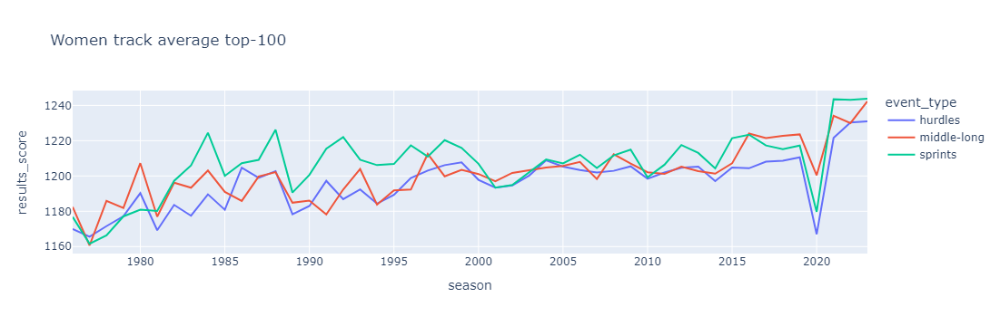

In [861]:
px.line(data_frame=w_top_season_eventtype_track, x='season', y='results_score', color='event_type', title="Women track average top-100 ")

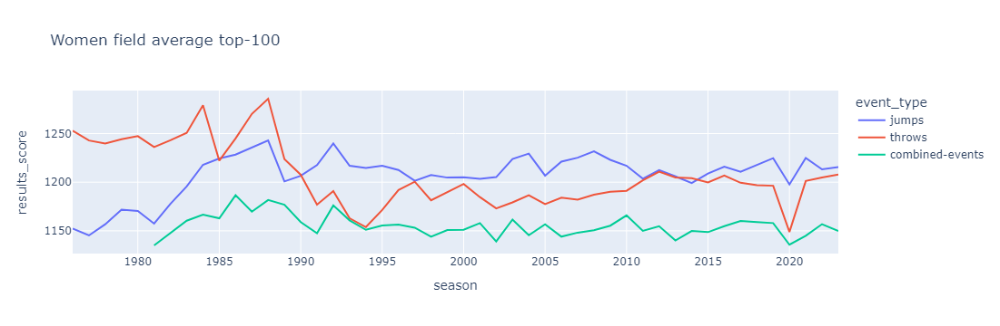

In [862]:
px.line(data_frame=w_top_season_eventtype_field, x='season', y='results_score', color='event_type', title="Women field average top-100 ")

In [806]:
scores = df.groupby(['era', 'gender'])['results_score'].mean().reset_index()

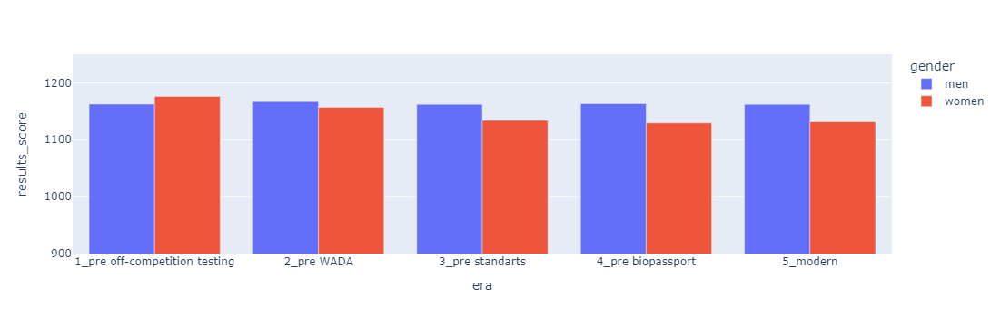

In [805]:
px.bar(data_frame=scores, x='era', y='results_score', color='gender', barmode='group', range_y=[900, 1250])

**Women's results declined while men's results remained about the same**

### Tournaments

In [922]:
df_olympic_women = df_olympic[df_olympic['gender'] == 'women']
df_olympic_men = df_olympic[df_olympic['gender'] == 'men']

In [954]:
min_scores_women = df_olympic_women.groupby('event_name')['results_score'].min().reset_index()
min_scores_men = df_olympic_men.groupby('event_name')['results_score'].min().reset_index()

In [1018]:
min_marks_women = (df_olympic_women
 .drop_duplicates(subset=['event_name', 'results_score'])
 .merge(min_scores_women, on=['event_name', 'results_score'], how='right')[['event_name', 'mark']])
min_marks_men = (df_olympic_men
 .drop_duplicates(subset=['event_name', 'results_score'])
 .merge(min_scores_men, on=['event_name', 'results_score'], how='right')[['event_name', 'mark']])
min_marks_men = min_marks_men[min_marks_men['event_name'] != 'heptathlon'].reset_index(drop=True)
min_marks_men.loc[[1, 2]] = min_marks_men.loc[[2,1]].values

index_heptathlon = min_marks_women[min_marks_women['event_name'] == 'heptathlon'].index[0]
index_decathlon = min_marks_men[min_marks_men['event_name'] == 'decathlon'].index[0]

decathlon_row = min_marks_men.loc[index_decathlon]
min_marks_men = min_marks_men.drop(index_decathlon).reset_index(drop=True)

min_marks_men = pd.concat([min_marks_men.iloc[:index_heptathlon], 
                           pd.DataFrame([decathlon_row]), 
                           min_marks_men.iloc[index_heptathlon:]]).reset_index(drop=True)

min_marks_women['mark'] = min_marks_women.apply(convert_to_minutes, axis=1)
min_marks_men['mark'] = min_marks_men.apply(convert_to_minutes, axis=1)

In [1019]:
display_side_by_side([min_marks_women, min_marks_men], ['Women', 'Men'])

,event_name,mark
0,100-metres,11.28
1,100-metres-hurdles,12.95
2,10000-metres,32:20.00
3,1500-metres,04:10.00
4,200-metres,23.11
5,3000-metres-steeplechase,10:06.08
6,400-metres,53.00
7,400-metres-hurdles,55.98
8,5000-metres,16:19.97
9,800-metres,02:01.45


In [897]:
unique_events_per_season = df_olympic.groupby('season').apply(lambda x: x[['date', 'venue']].drop_duplicates().shape[0], include_groups=False)

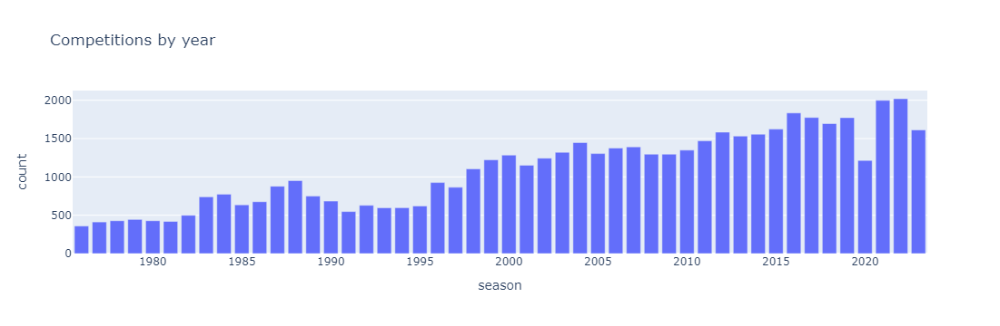

In [915]:
fig = px.bar(unique_events_per_season, title='Competitions by year', labels={'value': 'count'})
fig.update_layout(showlegend=False)

In [1021]:
df_olympic.groupby(['date', 'venue']).size().sort_values(ascending=False).reset_index().rename(columns={0: 'count'}).head(20)

,date,venue,count
0,2023-08-23,"Nemzeti Atlétikai Központ, Budapest (HUN)",310
1,2023-08-20,"Nemzeti Atlétikai Központ, Budapest (HUN)",265
2,2016-08-13,"Estádio Olímpico, Rio de Janeiro (BRA)",239
3,2016-08-16,"Estádio Olímpico, Rio de Janeiro (BRA)",234
4,2015-08-24,"National Stadium, Beijing (CHN)",230
5,2022-07-16,"Hayward Field, Eugene, OR (USA)",226
6,2021-08-03,"National Stadium, Tokyo (JPN)",214
7,2004-08-21,"Olympic Stadium, Athina (GRE)",214
8,2023-08-19,"Nemzeti Atlétikai Központ, Budapest (HUN)",213
9,2017-08-06,"Olympic Stadium, London (GBR)",213


### Alternative WR

In [1047]:
max_scores_women = df_olympic_women[df_olympic_women['season'] >= 2012].groupby('event_name')['results_score'].max().reset_index()
wr_women = max_scores_women.merge(df_olympic_women[df_olympic_women['season'] >= 2012], on=['event_name', 'results_score'], how='left')\
[['event_name', 'mark', 'name', 'date', 'venue']]
wr_women['mark'] = wr_women.apply(convert_to_minutes, axis=1)
wr_women

,event_name,mark,name,date,venue
0,100-metres,10.54,Elaine THOMPSON,2021-08-21,"Hayward Field, Eugene, OR (USA)"
1,100-metres-hurdles,12.12,Tobi AMUSAN,2022-07-24,"Hayward Field, Eugene, OR (USA)"
2,10000-metres,29:01.03,Letesenbet GIDEY,2021-06-08,"FBK Stadium, Hengelo (NED)"
3,1500-metres,03:49.11,Faith KIPYEGON,2023-06-02,"Stadio Luigi Ridolfi, Firenze (ITA)"
4,200-metres,21.41,Shericka JACKSON,2023-08-25,"Nemzeti Atlétikai Központ, Budapest (HUN)"
5,3000-metres-steeplechase,08:44.32,Beatrice CHEPKOECH,2018-07-20,"Stade Louis II, Monaco (MON)"
6,400-metres,48.14,Salwa Eid NASER,2019-10-03,"Khalifa International Stadium, Doha (QAT)"
7,400-metres-hurdles,50.68,Sydney MCLAUGHLIN,2022-07-22,"Hayward Field, Eugene, OR (USA)"
8,5000-metres,14:00.21,Gudaf TSEGAY,2023-09-17,"Hayward Field, Eugene, OR (USA)"
9,800-metres,01:54.25,Caster SEMENYA,2018-06-30,"Stade Charléty, Paris (FRA)"


In [1072]:
max_scores_men = df_olympic_men[df_olympic_men['season'] >= 2012].groupby('event_name')['results_score'].max().reset_index()
wr_men = max_scores_men.merge(df_olympic_men[df_olympic_men['season'] >= 2012], on=['event_name', 'results_score'], how='left')\
[['event_name', 'mark', 'name', 'date', 'venue']]
wr_men['mark'] = wr_men.apply(convert_to_minutes, axis=1)
hept_index = wr_men[wr_men['event_name'] == 'heptathlon'].index[0]
wr_men = wr_men.drop(hept_index).reset_index(drop=True)
wr_men

,event_name,mark,name,date,venue
0,100-metres,9.63,Usain BOLT,2012-08-05,"Olympic Stadium, London (GBR)"
1,10000-metres,26:11.00,Joshua CHEPTEGEI,2020-10-07,"Estadio de Atletismo del Turia, Valencia (ESP)"
2,110-metres-hurdles,12.80,Aries MERRITT,2012-09-07,"Boudewijnstadion, Bruxelles (BEL)"
3,1500-metres,03:30.60,Jakob INGEBRIGTSEN,2022-02-17,"Arena Stade Couvert, Liévin (FRA)"
4,1500-metres,03:26.69,Asbel KIPROP,2015-07-17,"Stade Louis II, Monaco (MON)"
5,200-metres,19.31,Noah LYLES,2022-07-21,"Hayward Field, Eugene, OR (USA)"
6,3000-metres-steeplechase,07:52.11,Lamecha GIRMA,2023-06-09,"Stade Charléty, Paris (FRA)"
7,400-metres,43.03,Wayde VAN NIEKERK,2016-08-14,"Estádio Olímpico, Rio de Janeiro (BRA)"
8,400-metres-hurdles,45.94,Karsten WARHOLM,2021-08-03,"National Stadium, Tokyo (JPN)"
9,5000-metres,12:35.36,Joshua CHEPTEGEI,2020-08-14,"Stade Louis II, Monaco (MON)"


## Individually

In [ ]:
nstarts = 15

**Athletes with 15+ starts are selected with an average of the top 10 scores**

### Women all-time leaders

**Sprints**

In [ ]:
events_sprints = df[(df['event_type'] == 'sprints')&(df['environment'] == 'outdoor')]['event_name'].unique()
leaders_tables_list = []
headers = []
for event in events_sprints[:-1]:
    leaders = best_athlete_results(athletes_with_starts('women', event, nstarts)).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

**Middle-long running**

In [ ]:
events_middle_long = ['800-metres','1500-metres','5000-metres', '10000-metres']
leaders_tables_list = []
headers = []
for event in events_middle_long[:2]:
    leaders = best_athlete_results(athletes_with_starts('women', event, nstarts)).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

In [ ]:
leaders_tables_list = []
headers = []
for event in events_middle_long[2:]:
    leaders = best_athlete_results(athletes_with_starts('women', event, nstarts), nbests=5).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

**Throws**

In [ ]:
events_throws = df[(df['event_type'] == 'throws')&(df['environment'] == 'outdoor')]['event_name'].unique()
leaders_tables_list = []
headers = []
for event in events_throws:
    leaders = best_athlete_results(athletes_with_starts('women', event, nstarts)).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

**Jumps**

In [ ]:
events_jumps = df[(df['event_type'] == 'jumps')&(df['environment'] == 'outdoor')]['event_name'].unique()
leaders_tables_list = []
headers = []
for event in events_jumps:
    leaders = best_athlete_results(athletes_with_starts('women', event, nstarts)).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

### Men all-time leaders

**Sprints**

In [ ]:
leaders_tables_list = []
headers = []
for event in events_sprints[:-1]:
    leaders = best_athlete_results(athletes_with_starts('men', event, nstarts)).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

**Middle-long running**

In [ ]:
leaders_tables_list = []
headers = []
for event in events_middle_long[:2]:
    leaders = best_athlete_results(athletes_with_starts('men', event, nstarts)).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

In [ ]:
leaders_tables_list = []
headers = []
for event in events_middle_long[2:]:
    leaders = best_athlete_results(athletes_with_starts('men', event, 10), nbests=5).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

**Throws**

In [ ]:
leaders_tables_list = []
headers = []
for event in events_throws:
    leaders = best_athlete_results(athletes_with_starts('men', event, nstarts)).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

**Jumps**

In [ ]:
leaders_tables_list = []
headers = []
for event in events_jumps:
    leaders = best_athlete_results(athletes_with_starts('men', event, nstarts)).head(10)
    headers.append(event)
    leaders_tables_list.append(leaders)

display_side_by_side(leaders_tables_list, headers)

### Athletes

In [ ]:
def athlete_results(name: str, df: pd.DataFrame=df, rank: bool = False) -> pd.DataFrame:
    athlete_df = df[df['name']==name].copy()
    drop_events = ['300-metres', '60-metres']
    athlete_df = athlete_df[~athlete_df['event_name'].isin(drop_events)]
    if not rank:                
        season_grouped = athlete_df.groupby(['season','event_name'], as_index=False)['mark'].min()
        result_df = season_grouped.pivot(index='season', columns='event_name')
        events = list(result_df.columns.get_level_values(1))    
        result_df.columns = events
        result_df = result_df.reset_index()
        result_df = result_df.fillna('-')    
        return result_df
    else:       
        season_grouped = athlete_df.groupby(['season','event_name'], as_index=False)['season_rank'].min()
        result_df = season_grouped.pivot(index='season', columns='event_name')
        events = list(result_df.columns.get_level_values(1))    
        result_df.columns = events
        result_df = result_df.reset_index()
        result_df = result_df.map(lambda x: int(x) if pd.notnull(x) else '-')              
        return result_df

In [ ]:
display_side_by_side([athlete_results('Allyson FELIX', rank=False), athlete_results('Allyson FELIX', rank=True)], ['Season bests', 'Season ranks'])

In [ ]:
display_side_by_side([athlete_results('Andre DE GRASSE', rank=False), athlete_results('Andre DE GRASSE', rank=True)], ['Season bests', 'Season ranks'])

# Throws

## Women

In [ ]:
ow_throws = df[
    (df['environment'] == 'outdoor')&
    (df['gender'] == 'women')&
    (df['event_type'] == 'throws')
].copy()
ow_throws['mark'] = ow_throws['mark'].astype('float')

In [ ]:
px.bar(ow_throws['event_name'].value_counts())

In [ ]:
event_names = ow_throws['event_name'].unique()
event_names

In [ ]:
cols = 2
rows = math.ceil(len(event_names)/cols)
fig = plt.figure(figsize=(10, 8))
for i, event in enumerate(event_names):
    plt.subplot(rows, cols, i+1)
    temp_data = ow_throws[ow_throws['event_name'] == event]
    sns.histplot(temp_data['season'], bins=len(temp_data['season'].unique()))
    plt.ylim(0, 700)    
    plt.title(event)
plt.subplots_adjust(hspace=0.4, wspace=0.2)

### Shot put

In [ ]:
ow_shot_put = ow_throws[ow_throws['event_name'] == 'shot-put']
ow_shot_put.shape

In [ ]:
season_bests = ow_shot_put.groupby('season')['mark'].max().reset_index()
px.line(season_bests.rolling(1, on='season').mean(), x='season', y='mark',title='Women shot put season bests')

**Calculate mean and median for top results in season**

In [ ]:
average_top = (
    ow_shot_put
    .groupby('season')
    .apply(lambda x: x.nlargest(20, 'mark')['mark']
    .agg(['mean', 'median']), include_groups=False)
    .reset_index()
)

In [ ]:
px.line(average_top, x='season', y='mean' ,title='Women shot put mean of top results')

In [ ]:
ntop = 300
top_results = ow_shot_put.sort_values(by='mark', ascending=False).head(ntop).groupby('season')['mark'].count()
fig = px.bar(
    top_results, 
    title=f'Top {ntop} all-time results by season (women shot put)', 
    labels={'value': 'count'}
)
fig.add_vline(x=1989, line_color='red', line_dash='dash')
fig.show()

In [ ]:
print(f'{top_results[top_results.index < 1989].sum()} results of the top-{ntop} were made before 1989')

### Discus

In [ ]:
ow_discus = ow_throws[ow_throws['event_name'] == 'discus-throw']
ow_discus.shape

In [ ]:
top = 300

top_results = ow_discus.sort_values(by='mark', ascending=False).head(top).groupby('season')['mark'].count()
fig = px.bar(top_results, title=f'Top {top} all-time results by season', labels={'value': 'count'})
fig.add_vline(x=1989, line_color='red', line_dash='dash')
fig.show()

In [ ]:
print(f'{top_results[top_results.index < 1989].sum()} results of the top-{top} were made before 1989')

### Hammer throw

In [ ]:
ow_hammer = ow_throws[ow_throws['event_name'] == 'hammer-throw']
ow_hammer.shape

In [ ]:
top = 300

top_results = ow_hammer.sort_values(by='mark', ascending=False).head(top).groupby('season')['mark'].count()
fig = px.bar(top_results, title=f'Top {top} all-time results by season', labels={'value': 'count'})
fig.show()

# Sprints

## Women

In [ ]:
ow_sprints = df[
    (df['environment'] == 'outdoor')&
    (df['gender'] == 'women')&
    (df['event_type'] == 'sprints')
].copy()
ow_sprints['mark'] = ow_sprints['mark'].astype('float')

In [ ]:
px.bar(ow_sprints['event_name'].value_counts())

In [ ]:
event_names = ow_sprints['event_name'].unique()
event_names

In [ ]:
cols = 2
rows = math.ceil(len(event_names)/cols)
fig = plt.figure(figsize=(10, 8))
for i, event in enumerate(event_names):
    plt.subplot(rows, cols, i+1)
    temp_data = ow_sprints[ow_sprints['event_name'] == event]
    sns.histplot(temp_data['season'], bins=len(temp_data['season'].unique()))
    plt.ylim(0, 700)
    plt.subplots_adjust(hspace=0.4, wspace=0.2)
    plt.title(event)

**Which is easier - running 100m faster than 11 seconds or 200m faster than 22 seconds**

In [ ]:
sprint_100 = ow_sprints[ow_sprints['event_name'] == '100-metres']['mark'].describe()
sprint_200 = ow_sprints[ow_sprints['event_name'] == '200-metres']['mark'].describe()
total = pd.concat([sprint_100, sprint_200], axis=1)
total.columns = ['sprint_100', 'sprint_200']
total

In [ ]:
top_1000_100 = ow_sprints[ow_sprints['event_name'] == '100-metres'].head(1000)
top_1000_200 = ow_sprints[ow_sprints['event_name'] == '200-metres'].head(1000)

In [ ]:
pd.DataFrame(pd.concat([
pd.Series({'100m < 11.00': len(top_1000_100[top_1000_100['mark'] < 11]) / 1000}),
pd.Series({'200m < 22.00': len(top_1000_200[top_1000_200['mark'] < 22]) / 1000})], axis=0), columns=['% of top-1000 results'])

### 200m

In [ ]:
ow_200m = ow_sprints[ow_sprints['event_name'] == '200-metres'].copy()
ow_200m.shape

In [ ]:
season_bests = ow_200m.groupby('season')['mark'].min().reset_index()
px.line(season_bests.rolling(1, on='season').mean(), x='season', y='mark',title='Women 200m season bests')

**Calculate mean and median for top results in season**

In [ ]:
average_top = (
    ow_200m
    .groupby('season')
    .apply(lambda x: x.nsmallest(20, 'mark')['mark']
    .agg(['mean', 'median']), include_groups=False)    
    .reset_index()
)
average_top[['mean', 'median']] = average_top[['mean', 'median']].rolling(2).mean()

In [ ]:
fig = px.line(average_top, x='season', y='mean' ,title="Seasonal averages of top women's 200m performances")
fig.add_hrect(y0=average_top['mean'].min(), y1=22.20, line_width=0, fillcolor="green", opacity=0.2)
fig.show()

In [ ]:
ow_200m[ow_200m['season_rank'] <= 10].groupby('season')['mark'].mean().sort_values(ascending=False).reset_index().set_index('season').head(10).T

In [ ]:
bins = [float('-inf'), 21.7, 22.0, 22.3, float('inf')]
labels = []
for i in range(len(bins) - 1):
    if bins[i] == float('-inf'):
        labels.append(f'<{bins[i+1]}')
    elif bins[i+1] == float('inf'):
        labels.append(f'>{bins[i]}')
    else:
        labels.append(f'{bins[i]}-{bins[i+1]}')
        
ow_200m['mark_group'] = pd.cut(ow_200m['mark'], bins=bins, labels=labels)

In [ ]:
grouped = ow_200m.groupby(['name', 'mark_group'], observed=True).size().reset_index(name='count')
grouped = grouped.pivot(index='name', columns='mark_group')
mark_group = list(grouped.columns.get_level_values(1))    
grouped.columns = mark_group
grouped = grouped.reset_index()
grouped[grouped.columns[1:]] = grouped[grouped.columns[1:]].map(lambda x: int(x) if pd.notnull(x) else 0) 

In [ ]:
colname = grouped.columns
leaders = (
    grouped
    .sort_values(
        by=[colname[1], colname[2]], 
        key=lambda x: grouped[colname[1]] + grouped[colname[2]],
        ascending=[False, False]
    )
    .reset_index(drop=True)
)
leaders.index += 1

In [ ]:
leaders.head(15)

In [ ]:
ow_200m[ow_200m['mark'] < 21.7]

### 400m

In [ ]:
ow_400m = ow_sprints[ow_sprints['event_name'] == '400-metres'].copy()
ow_400m.shape

In [ ]:
season_bests = ow_400m.groupby('season')['mark'].min().reset_index()
px.line(season_bests.rolling(1, on='season').mean(), x='season', y='mark',title='Women 400m season bests')

**Calculate mean and median for top results in season**

In [ ]:
average_top = (
    ow_400m
    .groupby('season')
    .apply(lambda x: x.nsmallest(10, 'mark')['mark']
    .agg(['mean', 'median']), include_groups=False)
    .reset_index()
)
average_top[['mean', 'median']] = average_top[['mean', 'median']].rolling(3).mean()

In [ ]:
px.line(average_top, x='season', y='mean' ,title='Women 400m mean of top results')

In [ ]:
top = 100

top_results = ow_400m.sort_values(by='mark', ascending=False).tail(top).groupby('season')['mark'].count()
fig = px.bar(top_results, title='Top all-time results broken down by season with off-season doping test entry date (1989)', labels={'value': 'count'})
fig.add_vline(x=1989, line_color='red', line_dash='dash')
fig.show()

In [ ]:
print(f'{top_results[top_results.index < 1989].sum()} results of the top-{top} were made before 1989')

In [ ]:
bins = [float('-inf'), 49.0, 49.5, 50.0, float('inf')]
labels = []
for i in range(len(bins) - 1):
    if bins[i] == float('-inf'):
        labels.append(f'<{bins[i+1]}')
    elif bins[i+1] == float('inf'):
        labels.append(f'>{bins[i]}')
    else:
        labels.append(f'{bins[i]}-{bins[i+1]}')
        
ow_400m['mark_group'] = pd.cut(ow_400m['mark'], bins=bins, labels=labels)

In [ ]:
grouped = ow_400m.groupby(['name', 'mark_group'], observed=True).size().reset_index(name='count')
grouped = grouped.pivot(index='name', columns='mark_group')
mark_group = list(grouped.columns.get_level_values(1))    
grouped.columns = mark_group
grouped = grouped.reset_index()
grouped[grouped.columns[1:]] = grouped[grouped.columns[1:]].map(lambda x: int(x) if pd.notnull(x) else 0) 

In [ ]:
colname = grouped.columns
leaders = (
    grouped
    .sort_values(by=[colname[1], colname[2]], key=lambda x: grouped[colname[1]] + grouped[colname[2]], ascending=False)
    .reset_index(drop=True)
)
leaders.index += 1

In [ ]:
leaders.head(15)

In [ ]:
px.histogram(find_athlete('Sanya RICHARDS', '400-metres')['mark'], nbins=30)